# Download datasets for mining

In [1]:
import json
import os
import sys
import pickle

import ee
from geojson import Point, Feature, FeatureCollection, dump
import geopandas
from keplergl import KeplerGl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from shapely.geometry import box, shape, Point, Polygon
from sklearn.manifold import TSNE

sys.path.append('../')
from scripts.get_s2_data_ee import get_history, get_history_polygon, get_pixel_vectors
from scripts.data_tools import *

%load_ext autoreload
%autoreload 2

In [2]:
# Sentinel 2 band descriptions
band_descriptions = {
    'B1': 'Aerosols, 442nm',
    'B2': 'Blue, 492nm',
    'B3': 'Green, 559nm',
    'B4': 'Red, 665nm',
    'B5': 'Red Edge 1, 704nm',
    'B6': 'Red Edge 2, 739nm',
    'B7': 'Red Edge 3, 779nm',
    'B8': 'NIR, 833nm',
    'B8A': 'Red Edge 4, 864nm',
    'B9': 'Water Vapor, 943nm',
    'B11': 'SWIR 1, 1610nm',
    'B12': 'SWIR 2, 2186nm'
}

# Create 84 px Dataset

In [50]:
# rect_width 0.0075 creates 84px patches
rect_width = 0.0075
scale = 10
start_date='2019-03-01'
num_months = 3

## Generate Sampling Coordinates

In [51]:
# Load polygon data sources
data_dir = os.path.join('..', 'data')

with open(os.path.join(data_dir, 'MinesPos2018-2020Sentinel.geojson'), 'r') as f:
    positive_polygons = json.load(f)
    
with open(os.path.join(data_dir, 'MinesNeg2018-2020Sentinel.geojson'), 'r') as f:
    negative_polygons = json.load(f)
    
with open(os.path.join(data_dir, 'MinesNeg_caleb_selection.geojson'), 'r') as f:
    additional_negative_sites = json.load(f)['features']

Positive Polygon Sampling


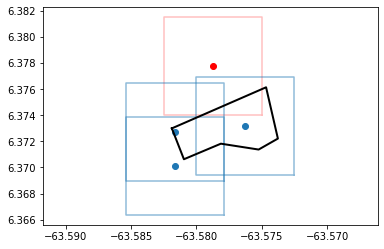

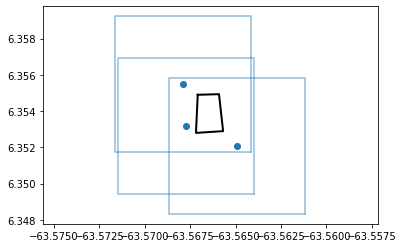

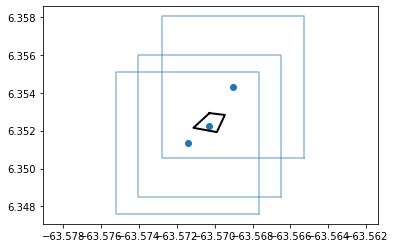

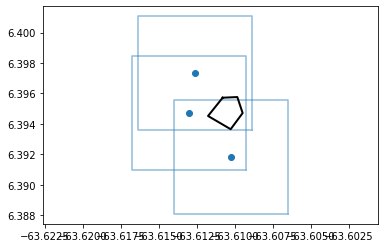

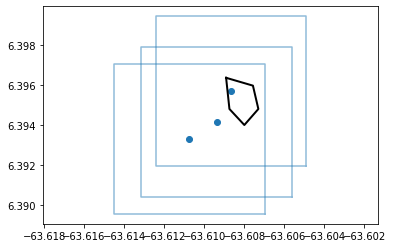

Negative Polygon Sampling


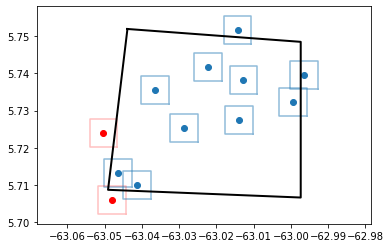

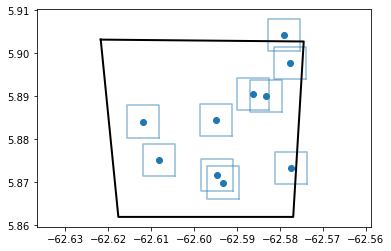

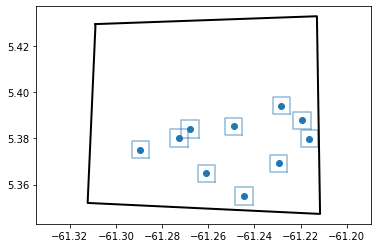

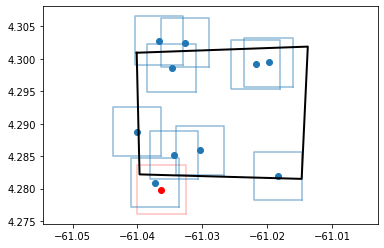

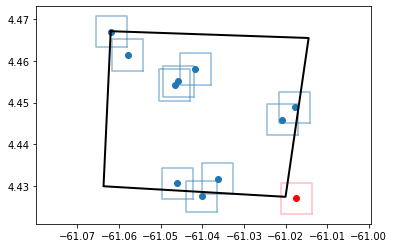

In [54]:
# Visualize sampling
print("Positive Polygon Sampling")
for i in range(5):
    poly_coords = positive_polygons['features'][i]['geometry']['coordinates'][0]
    _ = sample_polygon(poly_coords, 3, plot=True, rect_width=rect_width)
    
print("Negative Polygon Sampling")
for i in range(5):
    poly_coords = negative_polygons['features'][i]['geometry']['coordinates'][0]
    _ = sample_polygon(poly_coords, 10, plot=True, rect_width=rect_width)

In [65]:
positive_coords = sample_geojson(positive_polygons, 3, rect_width=rect_width)[0]

#negative_polygon_coords = sample_geojson(negative_polygons, 15, rect_width=rect_width)
#additional_negative_coords = [site['geometry']['coordinates'] for site in additional_negative_sites]
#negative_coords = negative_polygon_coords[0] + additional_negative_coords
negative_coords = sample_geojson(negative_polygons, 15, rect_width=rect_width)[0]


print('')
print(len(positive_coords), "total positive sites")
print(len(negative_coords), "total negative sites")

123 sampling sites selected from polygons
240 sampling sites selected from polygons

123 total positive sites
240 total negative sites


## Download Data

In [8]:
positive_history, positive_img_stack = get_image_stack(positive_coords, 
                                     start_date=start_date, 
                                     rect_width=rect_width, 
                                     scale=scale,
                                     num_months=num_months
                                    )

  0%|          | 0/3 [00:00<?, ?it/s]

 33%|███▎      | 1/3 [04:22<08:45, 262.60s/it]

 67%|██████▋   | 2/3 [09:01<04:27, 267.51s/it]

100%|██████████| 3/3 [13:23<00:00, 267.74s/it]


Cloud Fraction 0.34705882352941175
Cloud Fraction 0.05574229691876751
Cloud Fraction 0.7224089635854342
Cloud Fraction 0.31218487394957983
Cloud Fraction 0.1438375350140056
Cloud Fraction 0.1288265306122449
Cloud Fraction 0.039775910364145656
Cloud Fraction 0.03869047619047619
Cloud Fraction 0.039775910364145656
Cloud Fraction 0.03709342560553633
Cloud Fraction 0.03709342560553633
Cloud Fraction 0.02768166089965398
Cloud Fraction 0.004429065743944637
Cloud Fraction 0.03709342560553633
Cloud Fraction 0.03753501400560224
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.1557422969187675
Cloud Fraction 0.25311791383219956
Cloud Fraction 0.17647058823529413
Cloud Fraction 0.185467128027

In [57]:
negative_history, negative_img_stack = get_image_stack(negative_coords, 
                                     start_date=start_date, 
                                     rect_width=rect_width, 
                                     scale=scale,
                                     num_months=num_months
                                    )


  0%|          | 0/3 [00:00<?, ?it/s]

 33%|███▎      | 1/3 [13:00<26:01, 780.74s/it]

 67%|██████▋   | 2/3 [32:30<14:57, 897.58s/it]

 67%|██████▋   | 2/3 [48:42<24:21, 1461.30s/it]


KeyboardInterrupt: 

In [64]:
with open('../data/caroni_train/84_px_caroni_positive_images.pkl', 'rb') as f:
    positive_img_stack = pickle.load(f)
with open('../data/caroni_train/84_px_caroni_negative_images.pkl', 'rb') as f:
    negative_img_stack = pickle.load(f)

## Visualize Data Sample

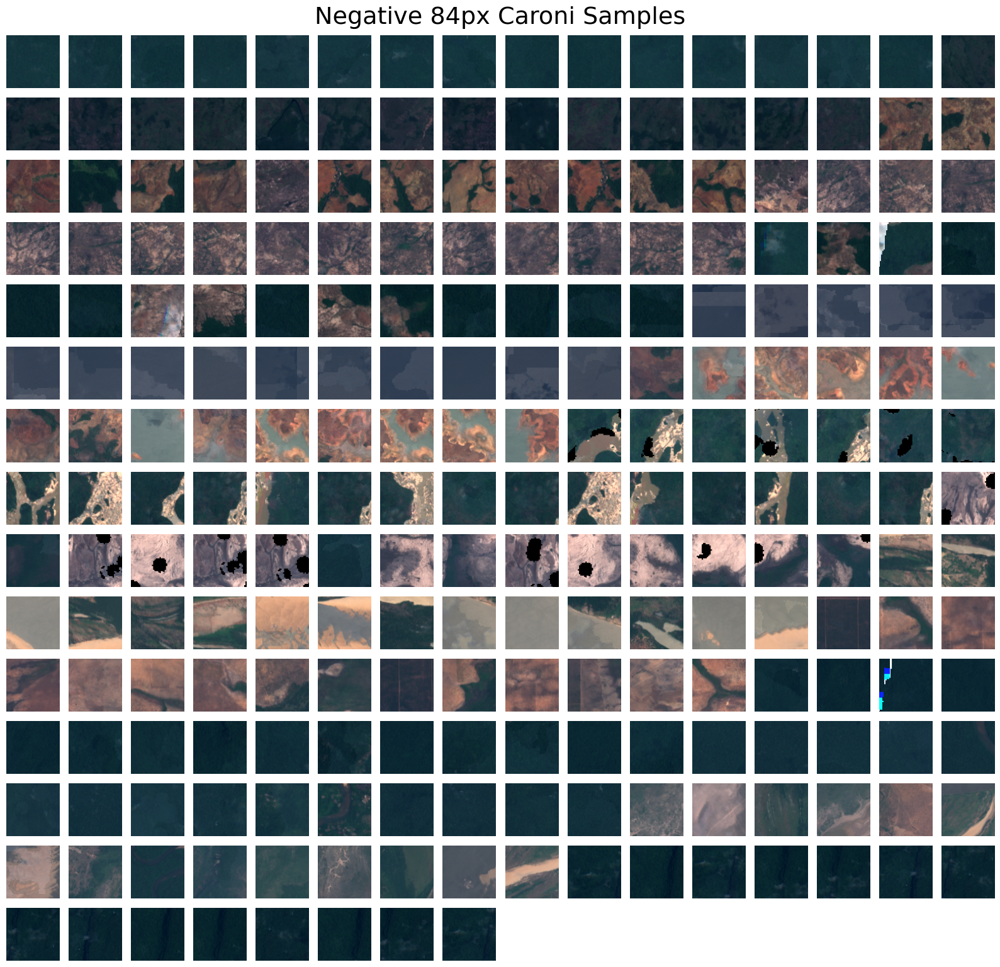

In [73]:
#plot_image_grid(create_rgb(positive_img_stack), 'Positive 84px Caroni Samples')
plot_image_grid(create_rgb(negative_img_stack[:232]), 'Negative 84px Caroni Samples')

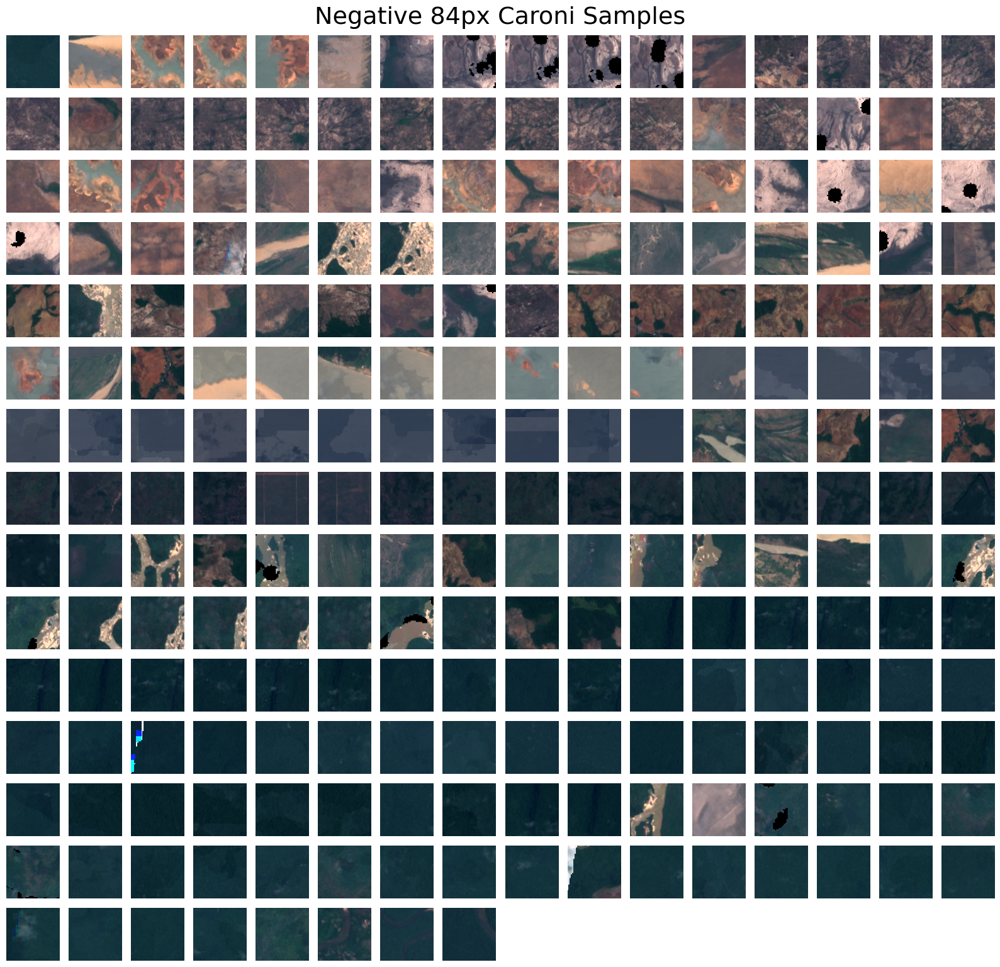

In [74]:
#plot_similar_images(positive_img_stack, 'Positive 84px Caroni Samples')
plot_similar_images(negative_img_stack[:232], 'Negative 84px Caroni Samples')

## Save Data

In [76]:
data_dir = os.path.join('..', 'data', 'caroni_train')
if not os.path.exists(data_dir):
    os.mkdir(data_dir)

# Positive Class
filename = f"{np.shape(positive_img_stack)[1]}_px_caroni_positive_"
with open(os.path.join(data_dir, filename + 'images.pkl'), 'wb') as f:
    pickle.dump(positive_img_stack, f)
    
with open(os.path.join(data_dir, filename + 'labels.pkl'), 'wb') as f:
    pickle.dump(np.ones(len(positive_img_stack)), f)
    
# Negative Class
filename = f"{np.shape(negative_img_stack)[1]}_px_additional_negative_"
with open(os.path.join(data_dir, filename + 'images.pkl'), 'wb') as f:
    pickle.dump(negative_img_stack[232:], f)
    
with open(os.path.join(data_dir, filename + 'labels.pkl'), 'wb') as f:
    pickle.dump(np.zeros(len(negative_img_stack[232:])), f)

# Create 28 px Dataset

In [15]:
# rect_width 0.0025 creates 28px patches
rect_width = 0.0025
scale = 10
start_date='2019-03-01'
num_months = 3

## Generate Sampling Coordinates
Because a 28px patch is 3x smaller than 84px, I am tripling the number of polygon samples

Positive Polygon Sampling


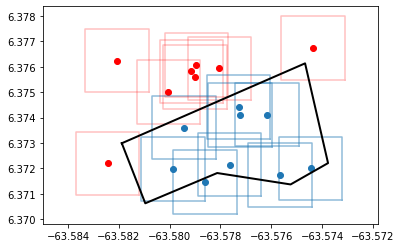

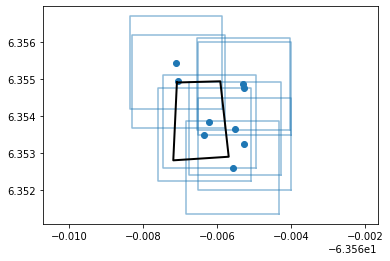

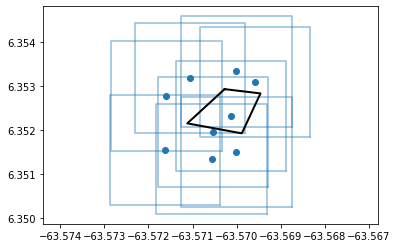

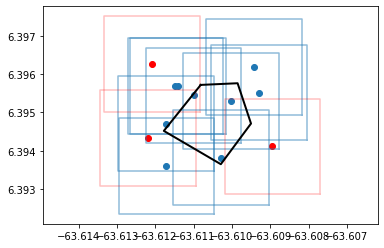

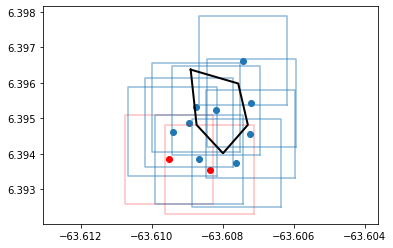

Negative Polygon Sampling


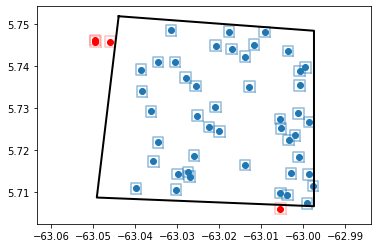

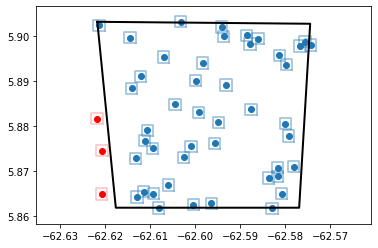

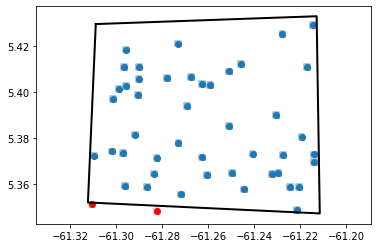

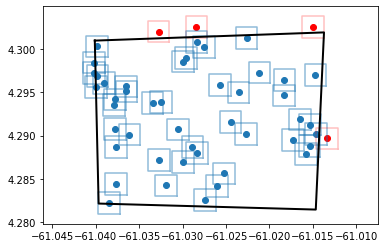

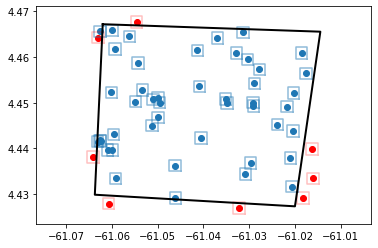

In [16]:
# Visualize sampling
print("Positive Polygon Sampling")
for i in range(5):
    poly_coords = positive_polygons['features'][i]['geometry']['coordinates'][0]
    _ = sample_polygon(poly_coords, 3*3, plot=True, rect_width=rect_width)
    
print("Negative Polygon Sampling")
for i in range(5):
    poly_coords = negative_polygons['features'][i]['geometry']['coordinates'][0]
    _ = sample_polygon(poly_coords, 15*3, plot=True, rect_width=rect_width)

In [17]:
positive_coords = sample_geojson(positive_polygons, 3 * 3, rect_width=rect_width)[0]

negative_polygon_coords = sample_geojson(negative_polygons, 15 * 3, rect_width=rect_width)
additional_negative_coords = [site['geometry']['coordinates'] for site in additional_negative_sites]
negative_coords = negative_polygon_coords[0] + additional_negative_coords

print('')
print(len(positive_coords), "total positive sites")
print(len(negative_coords), "total negative sites")

369 sampling sites selected from polygons
720 sampling sites selected from polygons

369 total positive sites
804 total negative sites


## Download Data

In [18]:
positive_history, positive_img_stack = get_image_stack(positive_coords, 
                                     start_date=start_date, 
                                     rect_width=rect_width, 
                                     scale=scale,
                                     num_months=num_months
                                    )

  0%|          | 0/3 [00:00<?, ?it/s]

 33%|███▎      | 1/3 [13:58<27:56, 838.04s/it]

 67%|██████▋   | 2/3 [25:58<13:22, 802.89s/it]

100%|██████████| 3/3 [37:13<00:00, 744.61s/it]


Cloud Fraction 0.0049261083743842365
Cloud Fraction 0.7003567181926278
Cloud Fraction 0.052318668252080855
Cloud Fraction 0.08799048751486326
Cloud Fraction 0.026159334126040427
Cloud Fraction 0.057074910820451845
Cloud Fraction 0.16502463054187191
Cloud Fraction 0.07372175980975029
Cloud Fraction 0.3162901307966706
Cloud Fraction 0.0
Cloud Fraction 0.0047562425683709865
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.03329369797859691
Cloud Fraction 0.0960591133004926
Cloud Fraction 0.10837438423645321
Cloud Fraction 0.39285714285714285
Cloud Fraction 0.27824019024970276
Cloud Fraction 0.2544589774078478
Cloud Fraction 0.2512315270935961
Cloud Fraction 0.1330049261083744
Cloud Fraction 0.03804994054696789
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.12366230677764566
Cloud Fraction 0.03804994054696789
Cloud Fraction 0.0713436385255648
Cloud Fraction 0.0
Cl

In [19]:
negative_history, negative_img_stack = get_image_stack(negative_coords, 
                                     start_date=start_date, 
                                     rect_width=rect_width, 
                                     scale=scale,
                                     num_months=num_months
                                    )


  0%|          | 0/3 [00:00<?, ?it/s]

 33%|███▎      | 1/3 [1:23:51<2:47:43, 5031.50s/it]

 67%|██████▋   | 2/3 [2:38:47<1:21:10, 4870.96s/it]

100%|██████████| 3/3 [3:25:02<00:00, 4100.83s/it]  


Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fracti

Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fraction 0.0
Cloud Fracti

In [77]:
with open('../data/caroni_train/28_px_caroni_positive_images.pkl', 'rb') as f:
    positive_img_stack = pickle.load(f)
with open('../data/caroni_train/28_px_caroni_negative_images.pkl', 'rb') as f:
    negative_img_stack = pickle.load(f)

In [79]:
len(negative_img_stack) - len(additional_negative_coords)

695

## Visualize Data Sample

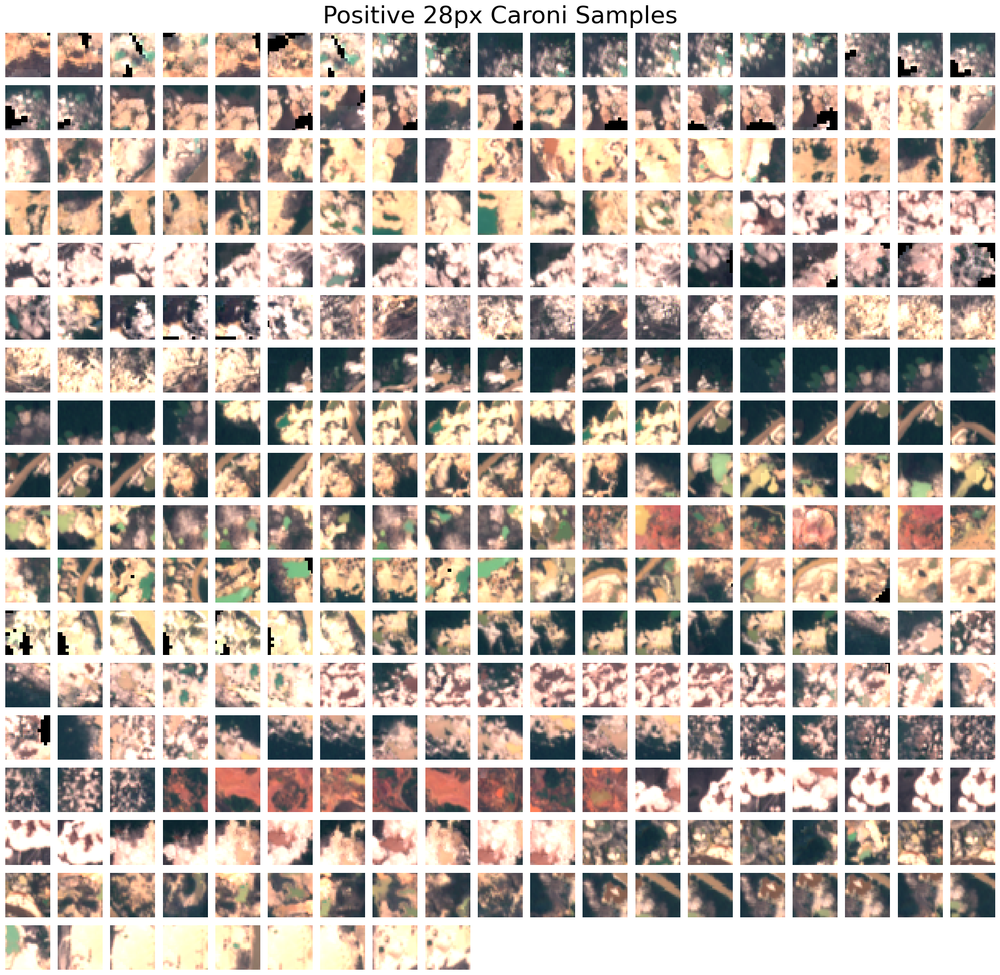

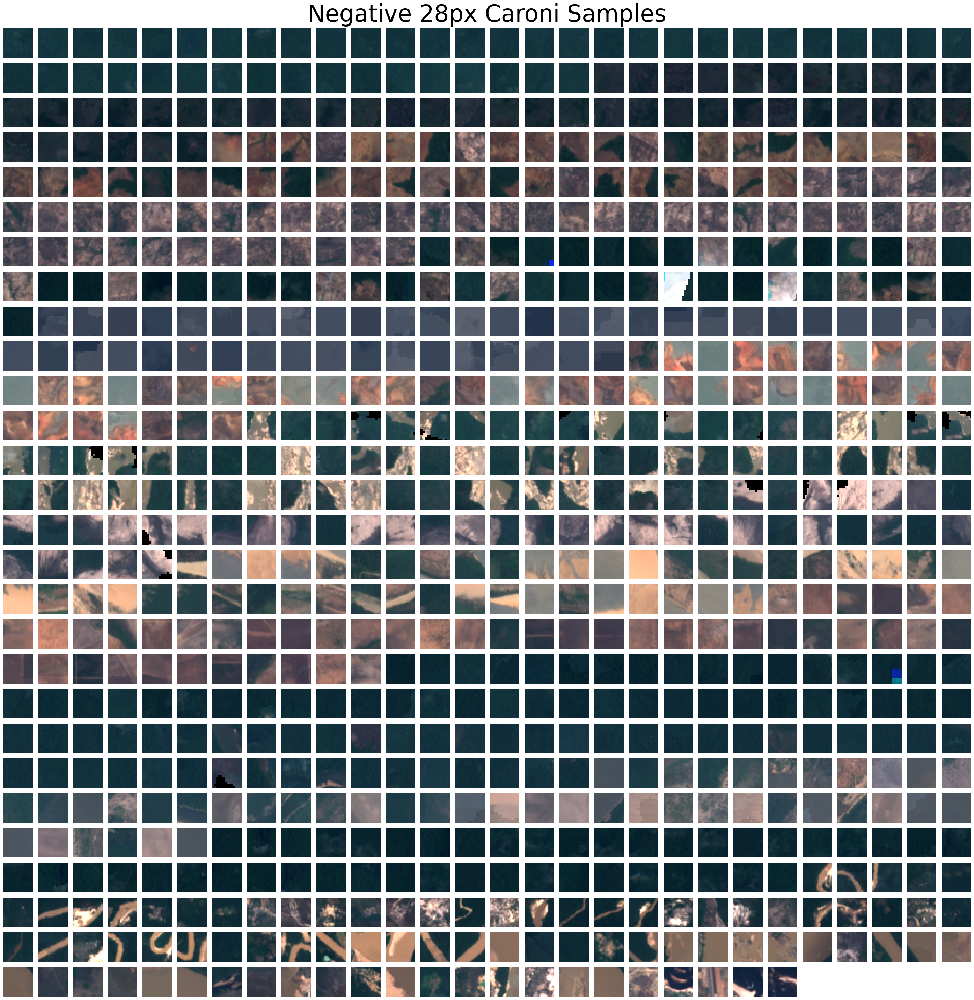

In [45]:
plot_image_grid(create_rgb(positive_img_stack), 'Positive 28px Caroni Samples')
plot_image_grid(create_rgb(negative_img_stack), 'Negative 28px Caroni Samples')

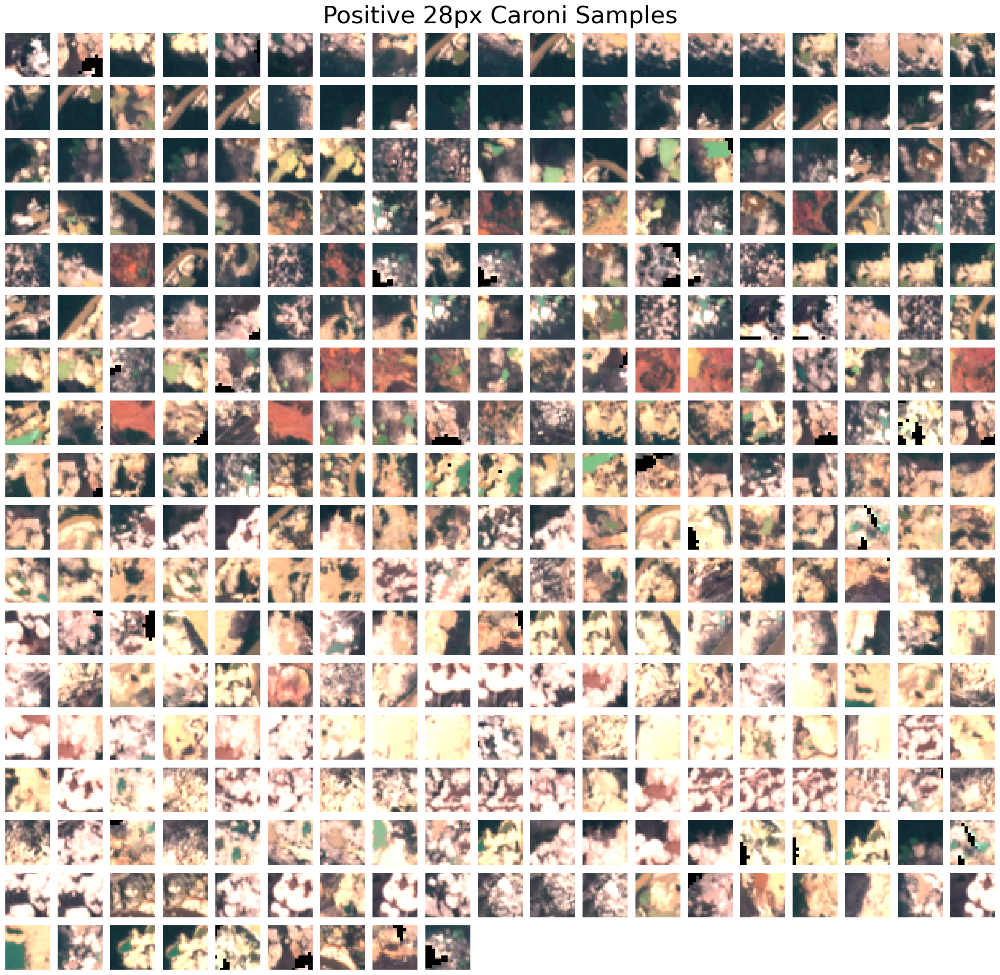

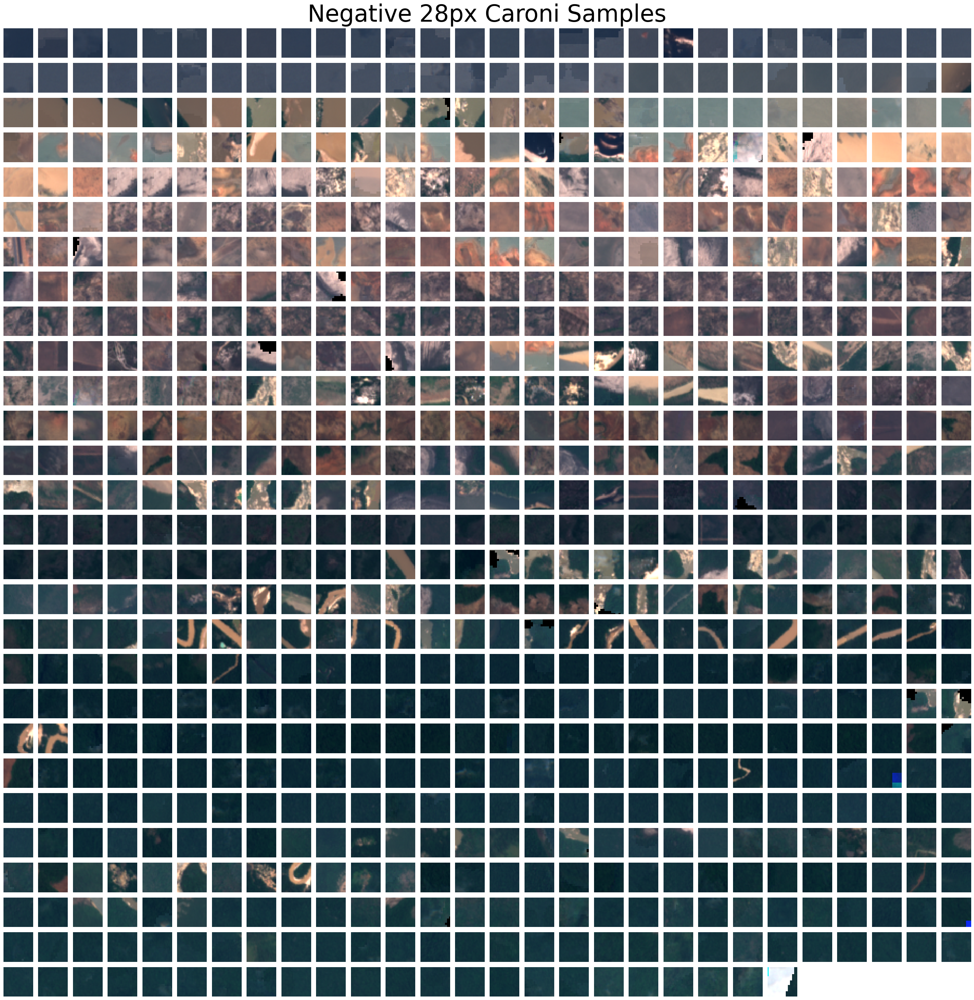

In [46]:
plot_similar_images(positive_img_stack, 'Positive 28px Caroni Samples')
plot_similar_images(negative_img_stack, 'Negative 28px Caroni Samples')

## Save Data

In [81]:
data_dir = os.path.join('..', 'data', 'caroni_train')
if not os.path.exists(data_dir):
    os.mkdir(data_dir)

# Positive Class
filename = f"{np.shape(positive_img_stack)[1]}_px_caroni_positive_"
with open(os.path.join(data_dir, filename + 'images.pkl'), 'wb') as f:
    pickle.dump(positive_img_stack, f)
    
with open(os.path.join(data_dir, filename + 'labels.pkl'), 'wb') as f:
    pickle.dump(np.ones(len(positive_img_stack)), f)
    
# Negative Class
filename = f"{np.shape(negative_img_stack)[1]}_px_additional_negative_"
with open(os.path.join(data_dir, filename + 'images.pkl'), 'wb') as f:
    pickle.dump(negative_img_stack[695:], f)
    
with open(os.path.join(data_dir, filename + 'labels.pkl'), 'wb') as f:
    pickle.dump(np.zeros(len(negative_img_stack[695:])), f)